In [1]:
from saber.cnn_tools import *
from saber.data_tools import *

from keras import backend as K
from keras.models import load_model
import tensorflow as tf

import os
import sys
import time
import numpy as np
import json

from intern import array

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 15]

Using TensorFlow backend.
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:529: FutureWarn

In [2]:
print(f"GPU is enabled: {tf.test.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)}")

GPU is enabled: True


## Load a training data


In [3]:
x_train = np.load('../input/bloss18train_img.npy')
y_train = np.load('../input/bloss18-train-labels.npy')
y_train = y_train.squeeze()

# Data must be [slices, chan, row, col] (i.e., [Z, chan, Y, X])
x_train = x_train[:, np.newaxis, :, :].astype(np.float32)
y_train = y_train[:, np.newaxis, :, :].astype(np.float32)

# Pixel values must be in [0,1]
x_train /= 255.
y_train = (y_train > 0).astype('float32')

## Load the Modal
Next, we create a u-net model using Keras and load pre-trained wieghts. These weights were trained by JHU/APL and are available via their GitHub repo as indicated in a Dockerfile they use: (https://github.com/aplbrain/saber/blob/master/saber/i2g/detection/Dockerfile#L45)


In [4]:
width = 256
height = 256
tile_size = (width, height)
z_step = 1
output_file = "../output/bloss18_membrane_weights.npy"

np.random.seed(9999)
K.common.set_image_dim_ordering('th')

# Load model
model = create_unet((1, int(width), int(height)))
model.load_weights('../input/membrane_weights.hdf5')
model.compile(optimizer=Adam(lr=0.0001,beta_1=0.9,beta_2=0.999),
                        loss=pixelwise_crossentropy_loss_w,
                        metrics=[f1_score])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


## Continue to train the pre-trained model with our new data

In [5]:
train_pct = .5
output_dir = '../output/untracked/bloss18_membrane_weights'
n_epochs = 300
# Minibatch size
mb_size = 5
# num mb per epoch
n_mb_per_epoch = 3
# Save frequency
save_freq = 50
os.makedirs(output_dir, exist_ok=True)

# Data must be [slices, chan, row, col] (i.e., [Z, chan, Y, X])
# split into train and valid
train_slices = range(int(train_pct * x_train.shape[0]))
x_train = x_train[train_slices, ...]
y_train = y_train[train_slices, ...]

valid_slices = range(int(train_pct * x_train.shape[0]), x_train.shape[0])
x_valid = x_train[valid_slices, ...]
y_valid = y_train[valid_slices, ...]

print('training data has shape:     %s' % str(x_train.shape))
print('training labels has shape:   %s' % str(y_train.shape))
print('validation data has shape:   %s' % str(x_valid.shape))
print('validation labels has shape: %s' % str(y_valid.shape))

training data has shape:     (5, 1, 512, 512)
training labels has shape:   (5, 1, 512, 512)
validation data has shape:   (3, 1, 512, 512)
validation labels has shape: (3, 1, 512, 512)


In [6]:
# gtm:ignore
tic = time.time()
f1=train_model(x_train, y_train, x_valid, y_valid, model,
               output_dir, do_augment=False,
                n_epochs=n_epochs, mb_size=mb_size,
                n_mb_per_epoch=n_mb_per_epoch,
                save_freq=save_freq)

print('[info]: total time to train model: %0.2f min' %
      ((time.time() - tic) / 60.))

# Save the model for future use
model.save(output_file)

Training Progress:   0%|          | 0/300 [00:00<?, ?it/s]

f1 on validation data:    0.753
recent train performance: 0.777
y_hat min, max, mean:     0.00 / 0.99 / 0.21
[info]: total time to train model: 1.88 min


## Classify images
Now we run images through the network. This will result in probability images from 0-255 indicating the probability that a pixel is a membrane (or synapse). You can then use this to threshold and classify pixels.

We'll move to a new location in this dataset and cutout a chunk

In [7]:
# Save a cutout to a numpy array in ZYX order:
em = array("bossdb://bloss/bloss18/image")
x_test = em[175:175+16, 52800:52800+1024, 41000:41000+1024]

x_test = x_test[:, np.newaxis, :, :]
x_test = x_test.astype(np.float32)
x_test /= 255.

In [8]:
tic = time.time()
y_hat = np.zeros(x_test.shape)
for i in range(0, x_test.shape[0], z_step):
    y_hat[i:i+z_step, ...] = deploy_model(x_test[i:i+z_step, ...], model)

print('Total time to process entire volume: {}'.format(time.time() - tic))

Total time to process entire volume: 2.6634809970855713


In [9]:
# Reshape for output
y_hat = np.squeeze(np.transpose(y_hat, (3, 2, 0, 1)))
y_hat = np.floor(y_hat*255)

# Reshape the input so we can plot better
x_test_t = np.squeeze(np.transpose(x_test, (3, 2, 0, 1)))

## Plot some results
Finally, let's plot our image data and probability images together and see how we've done!

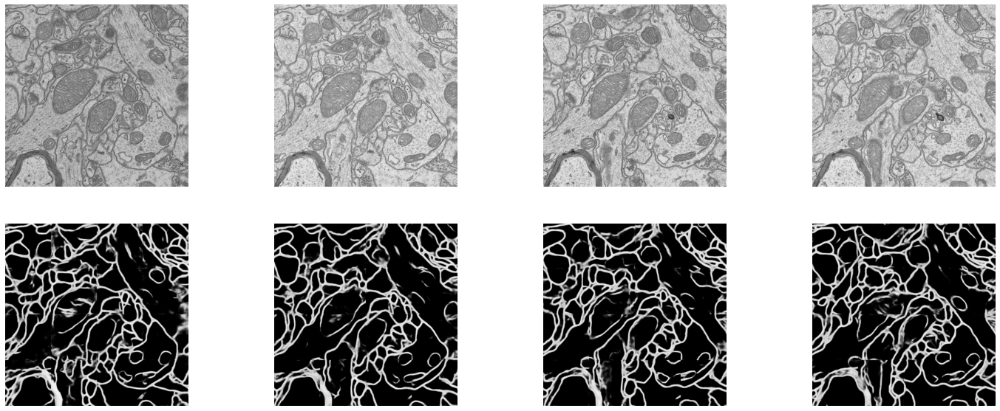

<Figure size 1080x1080 with 0 Axes>

In [10]:
# Plot some results
start_index = 0

fig=plt.figure(figsize=(25, 10));
columns = 4
rows = 2
offset = 2
for i in range(1, columns*rows + 1):
    fig.add_subplot(rows, columns, i);
    if i <= columns:
        plt.imshow(x_test_t[:, :, i-1+offset], cmap='gray', vmin=0, vmax=1);
        plt.axis('off');
    else:
        plt.imshow(y_hat[:, :, i-5+offset], cmap='gray', vmin=0, vmax=255);
        plt.axis('off');
plt.show();
plt.tight_layout();


In [11]:
fig = plt.figure(figsize=(12, 6),frameon=False, tight_layout=True);
x_test_t = np.floor(x_test_t*255)
im = plt.imshow(np.concatenate((x_test_t[:, :, 0], y_hat[:, :, 0]), axis=1), cmap='gray', vmin=0, vmax=255);
plt.axis('off');
plt.tight_layout();
plt.close(1)

def init():
    return [im.set_data(np.concatenate((x_test_t[:, :, 0], y_hat[:, :, 0]), axis=1))];

def animate(i):
    return [im.set_data(np.concatenate((x_test_t[:, :, i], y_hat[:, :, i]), axis=1))];

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=16,
                               interval=100);

HTML(anim.to_jshtml())